In [1]:
import matplotlib.pyplot as plt
%matplotlib widget
import sys
sys.path.append('/home/dtward/data/csh_data/emlddmm/')
import emlddmm
import numpy as np
from os import makedirs
from os.path import join


/home/dtward/intelpython3/lib/python3.12/site-packages/nibabel/optpkg.py:104: UserWarning: A NumPy version >=1.22.4 and <2.3.0 is required for this version of SciPy (detected version 2.5.1)
  pkg = __import__(name, fromlist=fromlist)


use display True


In [2]:
# load the target image
target_filename = '20241017_5xFAD_Etv1_MORF3_MEF119_3_4m_RH_9x_C1.npz'
outdir = '20241017_5xFAD_Etv1_MORF3_MEF119_3_4m_RH_9x_outputs_march_2026'
atlas_name  = '/home/dtward/Documents/UCLA/dong/Nissl_10_symmetric.tif'
outputname = 'yang_outputs_april_2026.npz'

In [3]:
makedirs(outdir,exist_ok=True)

In [4]:
J = []
for i in range(3):
    target_filename_ = target_filename.replace('C1',f'C{i+1}')
    data = np.load(target_filename_,allow_pickle=True)
    xJ = data['xI']
    I_ = data['I']
    I_ = I_ / np.mean(np.abs(I_))
    data.close()
    J.append(I_)
J = np.concatenate(J)
#J /= np.max(J)
J /= np.mean(np.abs(J))

(<Figure size 640x480 with 15 Axes>,
 array([[<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >],
        [<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >],
        [<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >]], dtype=object))

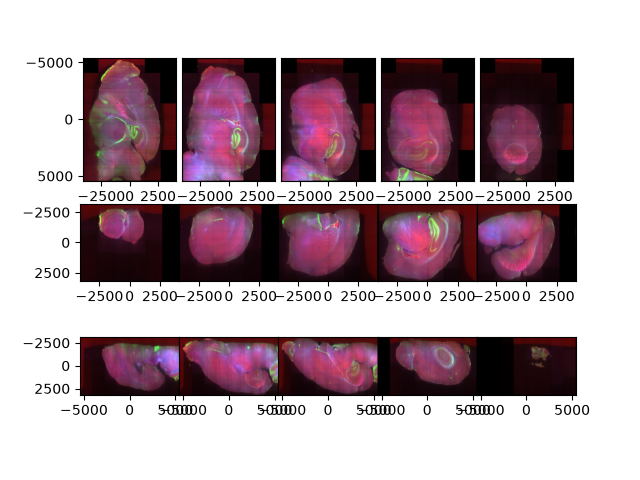

In [5]:
emlddmm.draw(J,xJ)

In [6]:
# okay i can just use them all
# what atlas do I want
atlas_name_25 = atlas_name.replace('_10_','_25_') # later save this
 #'/home/dtward/Documents/UCLA/dong/9.3.label.tif',




import tifffile        
I = tifffile.imread(atlas_name)
print(I_.shape)
if 'Nissl' in atlas_name:
    I = 1.0 - I.astype(np.float32) / 255.0
# NOTE THIS FMOST ATLAS IS 10 UM
xI = [np.arange(n)*10.0 - (n-1)*10.0/2 for n in I.shape[-3:]]    
if I.ndim == 3:
    I = I[None]

(1, 255, 435, 329)


In [7]:
print(I.shape)

(1, 1400, 900, 1140)


In [8]:
ind = I>0
m = np.quantile(I[ind],0.05)
print(m)
I[ind] -= m
I = I.clip(min=0)
I /= np.max(I)

0.18039215


(<Figure size 640x480 with 15 Axes>,
 array([[<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >],
        [<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >],
        [<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >]], dtype=object))

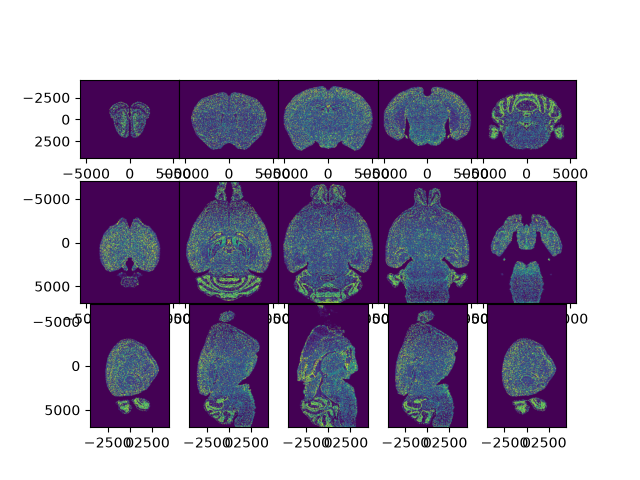

In [9]:
emlddmm.draw(I[:,::5,::5,::5],[x[::5] for x in xI])

In [10]:
# currently it is 10 um
# I can't get to 25 by an integer factor, but I can get to 10
def downsample(I,down):
    Id = []
    start = 1e-6 # this will be a float
    end = False
    while True:
        stop = start + down[-1]

        # now a weight for the first pixel
        start0 = np.floor(start).astype(int)
        startf = 1.0 - (start - start0) # if this is small, we want a big weight


        # a weight for the last pixel
        stop1 = np.ceil(stop).astype(int)
        if stop1 >= I.shape[-1]:
            stop1 = I.shape[-1]-1
            stop = stop1-1 # hack to make the weight 1
            end = True
        stopf = stop1 - stop
        w = np.ones(stop1-start0+1)

        w[0] = startf
        w[-1] = stopf


        Id_ = np.sum(I[...,start0:stop1+1]*w,-1)/np.sum(w)
        Id.append(Id_)

        start = start + down[-1]

        if end:
            break
    Id = np.stack(Id,-1)


    # now second last
    Idd = []
    start = 1e-6 # this will be a float
    end = False
    while True:
        stop = start + down[-2]

        # now a weight for the first pixel
        start0 = np.floor(start).astype(int)
        startf = 1.0 - (start - start0) # if this is small, we want a big weight


        # a weight for the last pixel
        stop1 = np.ceil(stop).astype(int)
        if stop1 >= I.shape[-2]:
            stop1 = I.shape[-2]-1
            stop = stop1-1 # hack to make the weight 1
            end = True
        stopf = stop1 - stop
        w = np.ones(stop1-start0+1)

        w[0] = startf
        w[-1] = stopf




        Id_ = np.sum(Id[...,start0:stop1+1,:]*w[...,None],-2)/np.sum(w)
        Idd.append(Id_)

        start = start + down[-2]

        if end:
            break
    Idd = np.stack(Idd,-2)
    
    
    
    # now third last
    Iddd = []
    start = 1e-6 # this will be a float
    end = False
    while True:
        stop = start + down[-3]

        # now a weight for the first pixel
        start0 = np.floor(start).astype(int)
        startf = 1.0 - (start - start0) # if this is small, we want a big weight


        # a weight for the last pixel
        stop1 = np.ceil(stop).astype(int)
        if stop1 >= I.shape[-3]:
            stop1 = I.shape[-3]-1
            stop = stop1-1 # hack to make the weight 1
            end = True
        stopf = stop1 - stop
        w = np.ones(stop1-start0+1)

        w[0] = startf
        w[-1] = stopf




        Id_ = np.sum(Idd[...,start0:stop1+1,:,:]*w[...,None,None],-3)/np.sum(w)
        Iddd.append(Id_)

        start = start + down[-3]

        if end:
            break
    Iddd = np.stack(Iddd,-3)
    return Iddd

In [11]:
Id = downsample(I,[2.5,2.5,2.5])

In [12]:
I = None

In [13]:
xId = [np.arange(n)*25.0 + x[0] for n,x in zip(Id.shape[-3:],xI)]

In [14]:
len(xI)

3

# IMPORTANT, set the initial guess for the affine transform

(<Figure size 640x480 with 15 Axes>,
 array([[<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >],
        [<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >],
        [<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >]], dtype=object))

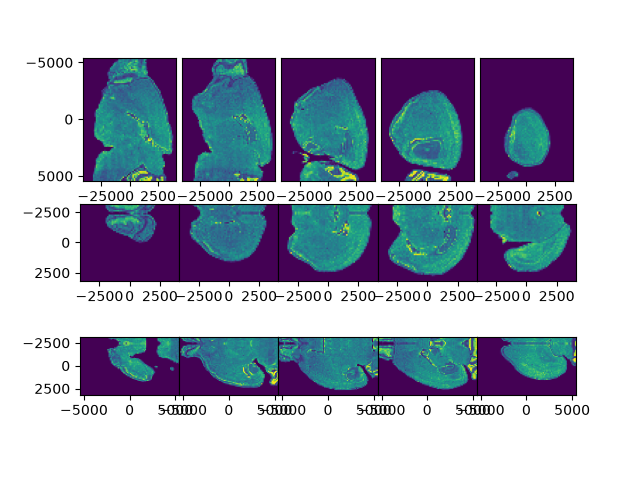

In [15]:
A0 = np.eye(4)
A0[:3,:3] = emlddmm.orientation_to_orientation('PIR','LPS')
A0[:3,-1] = [-2500,1000.0,0.0]
downshow = 5
toshow = emlddmm.apply_transform_float([x[::downshow] for x in xId], Id, emlddmm.compose_sequence([emlddmm.Transform(A0,'b')],[x[::downshow] for x in xJ]) )
emlddmm.draw(toshow,xJ)

In [16]:
# remove the original
# todo, save the downsampled

config = {
    'device':'cpu',
    'A':A0,
    'downI':[1,1,1],
    'downJ':[1,1,1],
    #'priors':[0.49,0.49,0.02],
    'a':200.0,
    'dv':200.0,
    'n_draw':20,
    'muB':[0.0,0.0,0.0],
    'muA':[5.0,5.0,5.0],    
    'update_muB':True,
    'update_muA':True,    
    'n_reduce_step':0,
    #'sigmaR':1e3,
    'sigmaR':5e2,
    'n_e_step':3,    
    'eA':1e5, # default 1e5
    'ev':1e-3, # default 2e3
    'v_start':0,
    'sigmaM':0.5,
    'sigmaB':0.5,
    'sigmaA':1.0, # was 0.5 I think it worked better
    'n_iter':500,
}
config0 = config.copy()

In [17]:
Id.max(),J.max()

(np.float64(0.7608636681856606), np.float64(69.17368623333029))

In [18]:
from scipy.ndimage import gaussian_filter

In [19]:
down = 8
xIdd,Idd = emlddmm.downsample_image_domain(xId,Id,[down]*3)
xJd,Jd = emlddmm.downsample_image_domain(xJ,J,[down]*3)
Idb = gaussian_filter(Idd,(0,0.5,0.5,0.5))
Jdb = gaussian_filter(Jd,(0,0.5,0.5,0.5))

(<Figure size 640x480 with 15 Axes>,
 array([[<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >],
        [<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >],
        [<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >]], dtype=object))

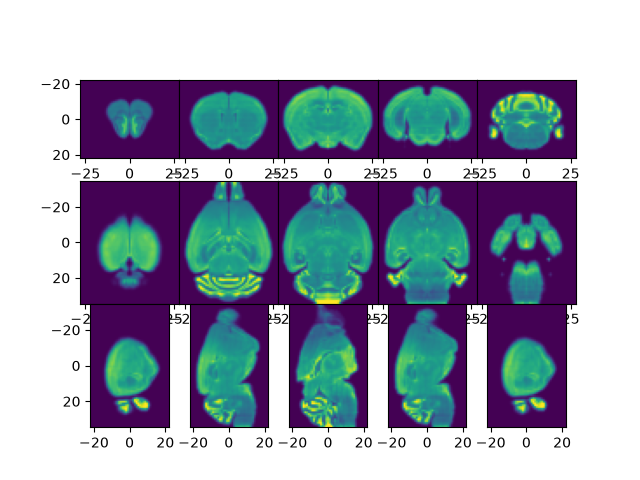

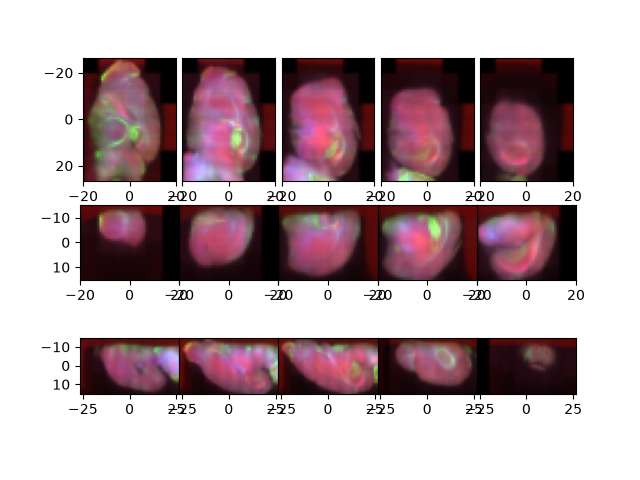

In [20]:
emlddmm.draw(Idb)
emlddmm.draw(Jdb)

' '

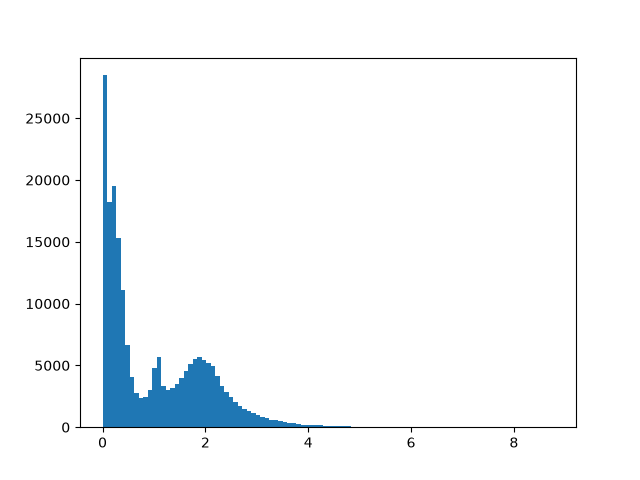

In [21]:
fig,ax = plt.subplots()
ax.hist(Jdb.ravel(),100)
' '

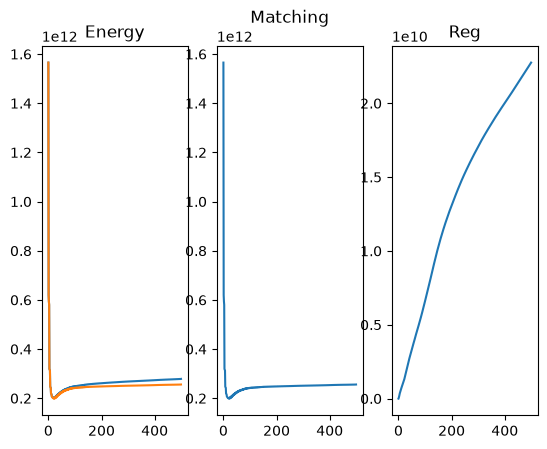

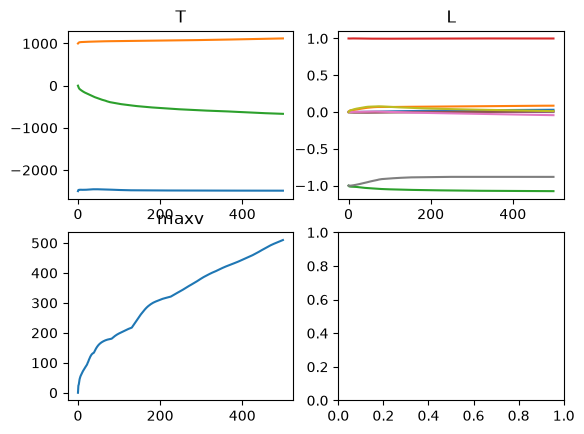

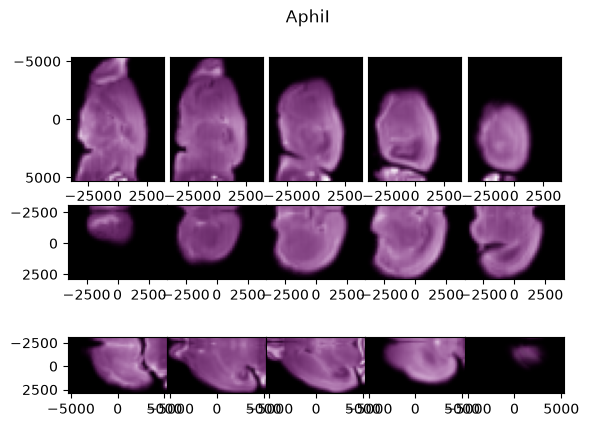

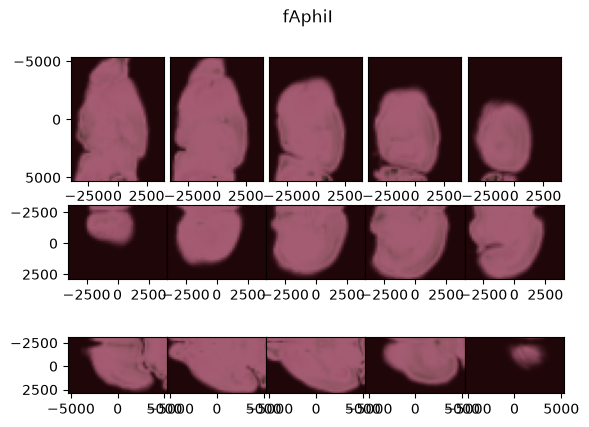

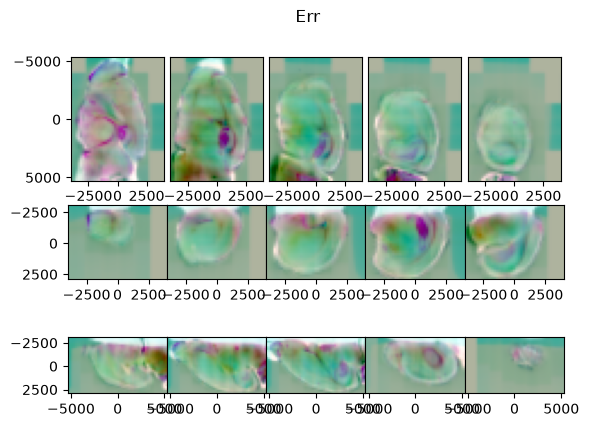

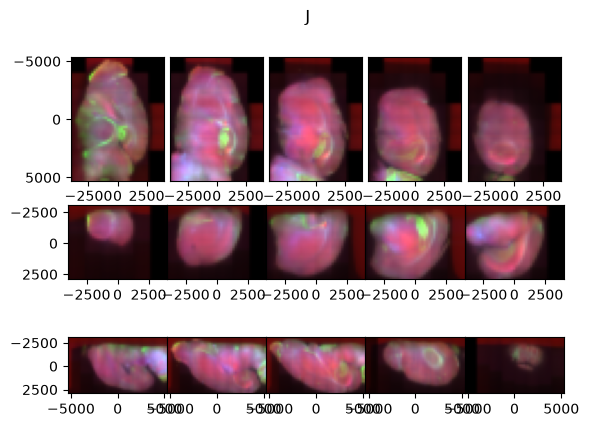

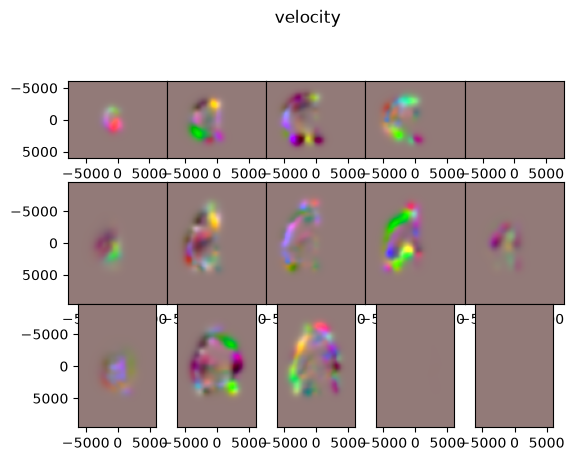

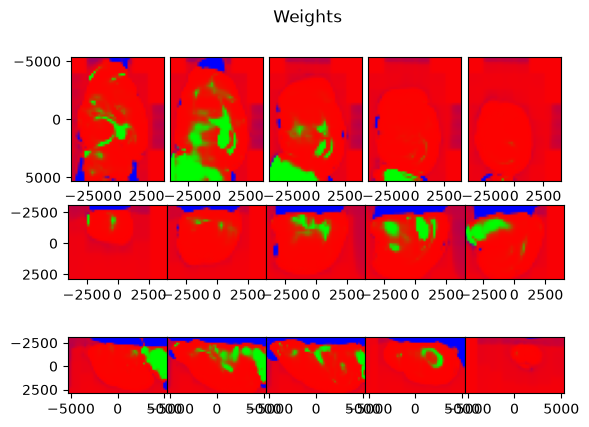

/home/dtward/data/csh_data/emlddmm/emlddmm.py:188: RuntimeWarning: invalid value encountered in divide
  J /= (vmax[:,None,None,None] - vmin[:,None,None,None])


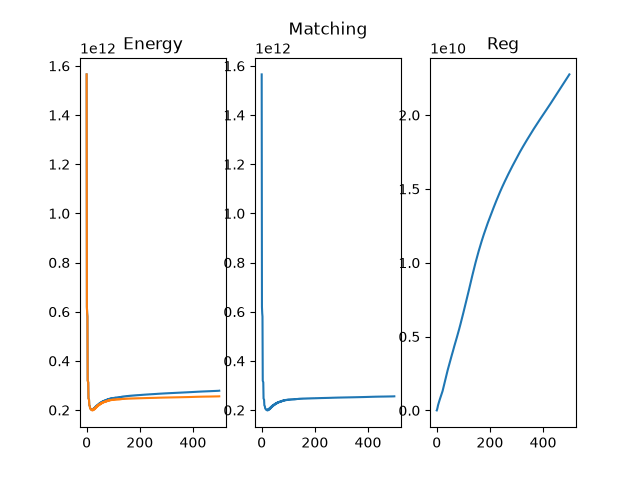

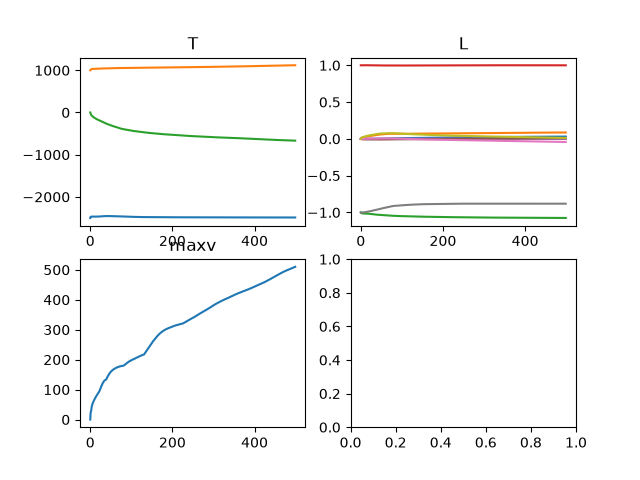

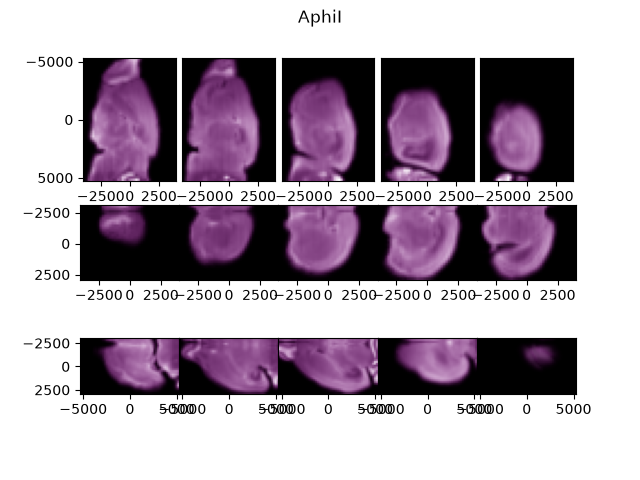

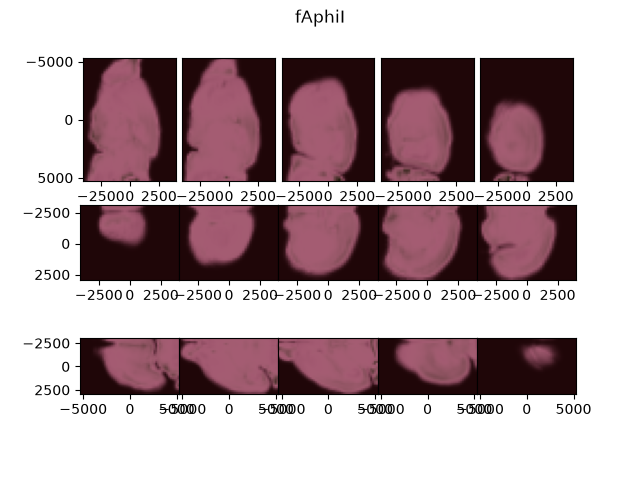

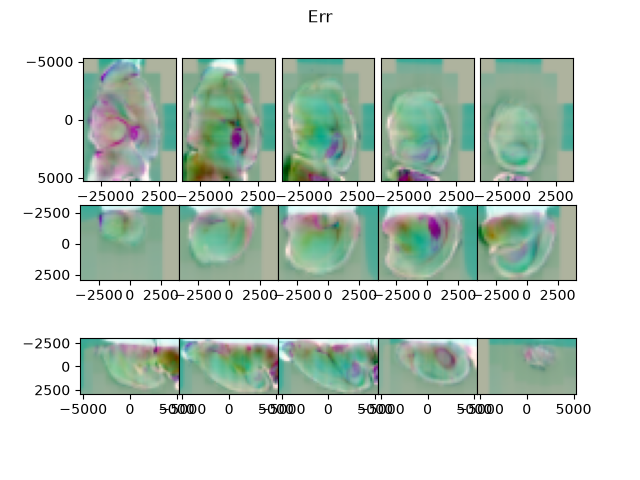

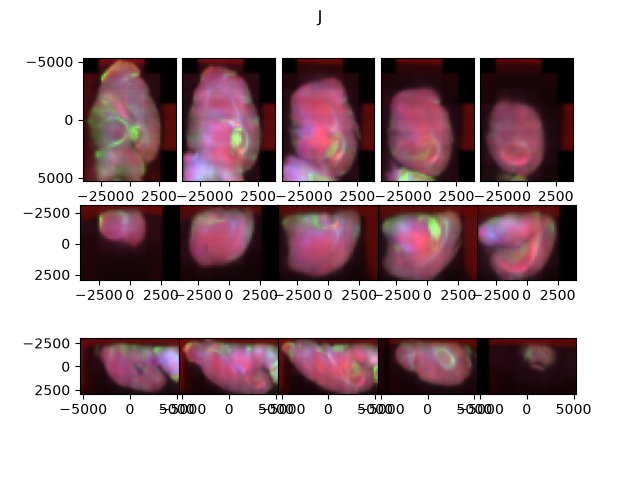

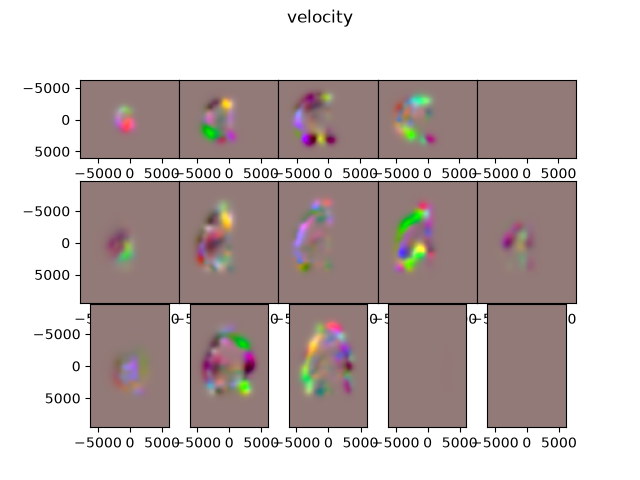

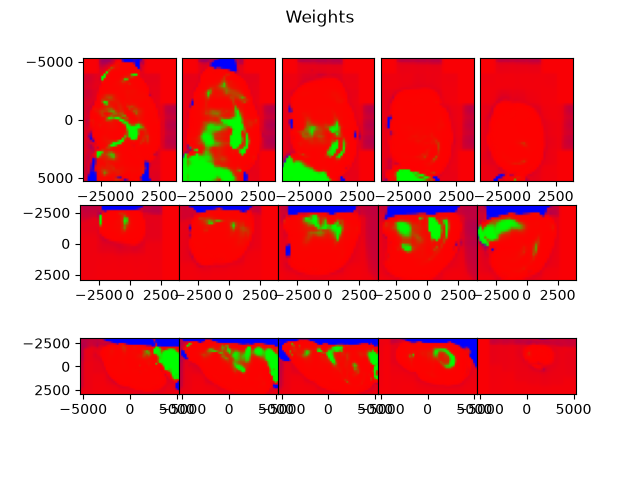

In [22]:
Istack = np.concatenate((Idb/np.max(Idb),(Idb/np.max(Idb))**2))
#Istack = np.concatenate((Idb/np.max(Idb),(Idb/np.max(Idb))**2, (Idb/np.max(Idb))**3))
out = emlddmm.emlddmm(I=Istack,xI=xIdd,J=Jdb,xJ=xJd,**config)


In [23]:
down = 4
xIdd,Idd = emlddmm.downsample_image_domain(xId,Id,[down]*3)
xJd,Jd = emlddmm.downsample_image_domain(xJ,J,[down]*3)
Idb = gaussian_filter(Idd,(0,0.5,0.5,0.5))
Jdb = gaussian_filter(Jd,(0,0.5,0.5,0.5))



/home/dtward/data/csh_data/emlddmm/emlddmm.py:1489: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  A = torch.tensor(A.detach().clone(),device=device,dtype=dtype)


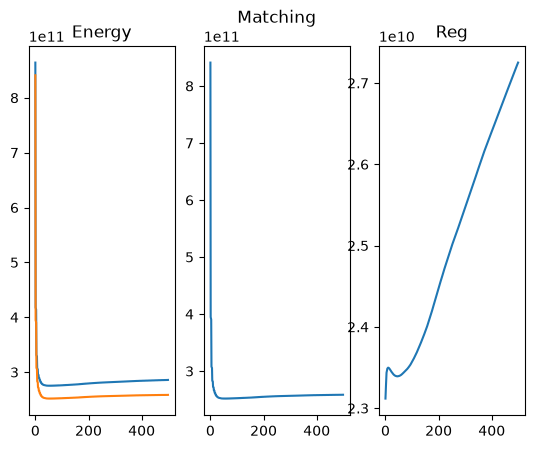

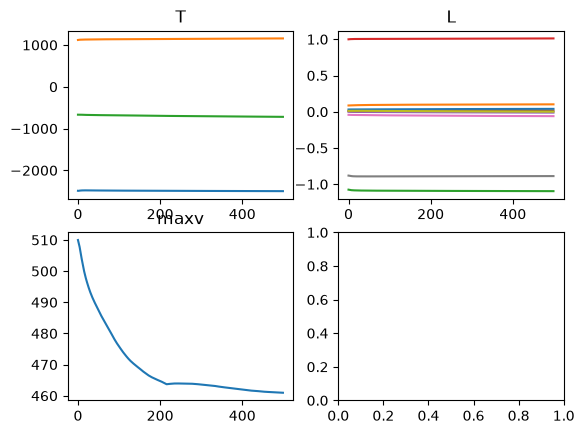

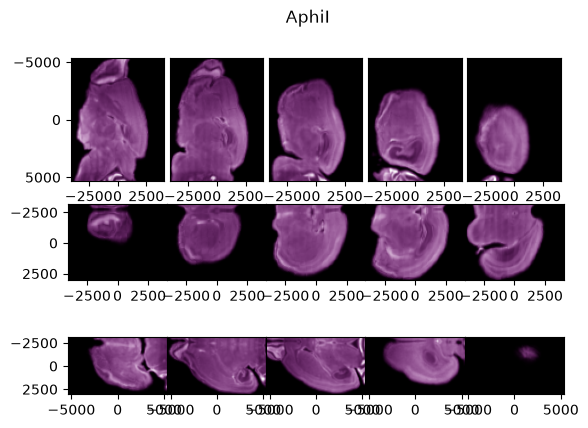

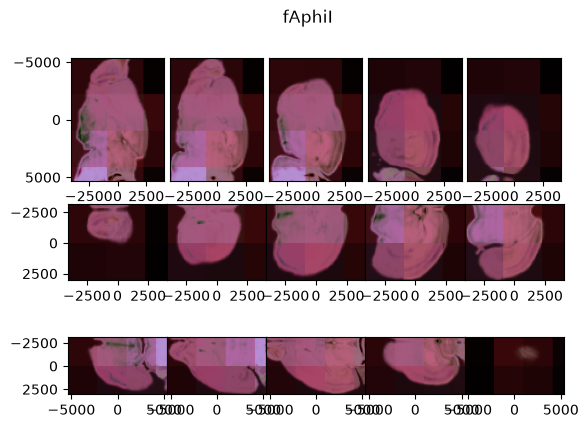

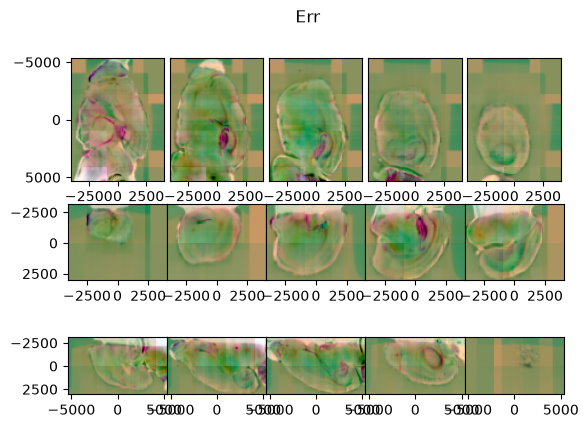

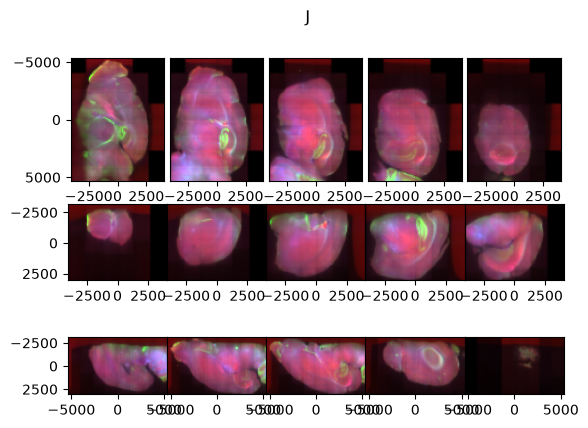

/home/dtward/data/csh_data/emlddmm/emlddmm.py:1580: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  figV = plt.figure()


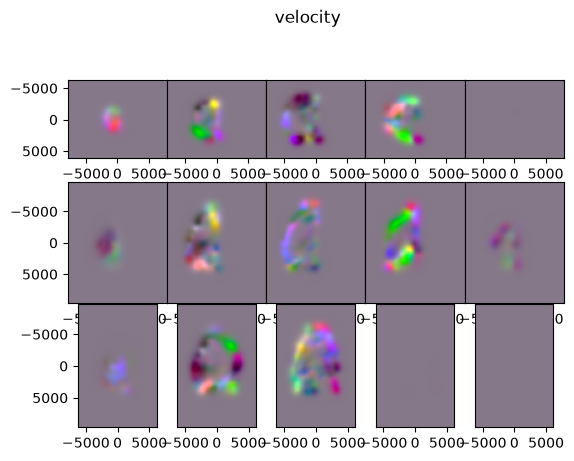

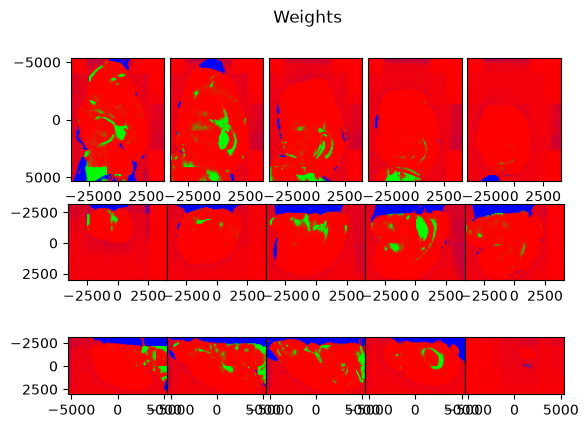

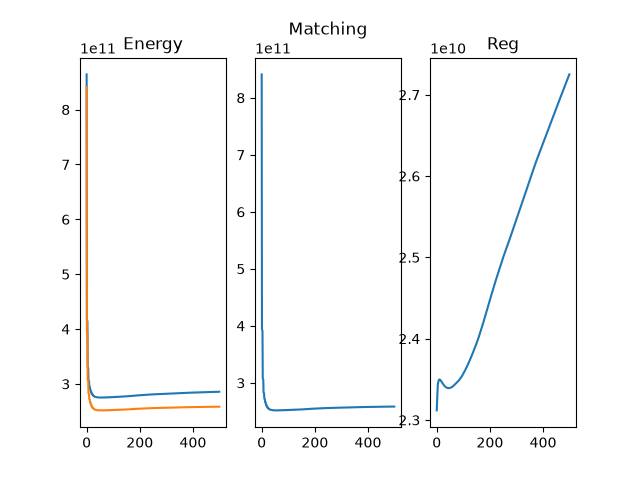

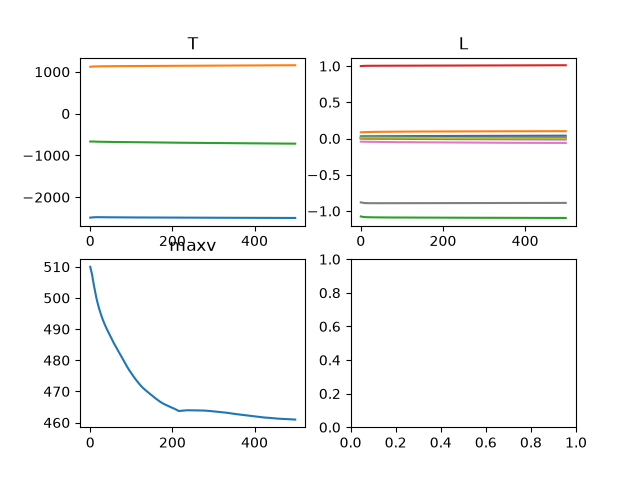

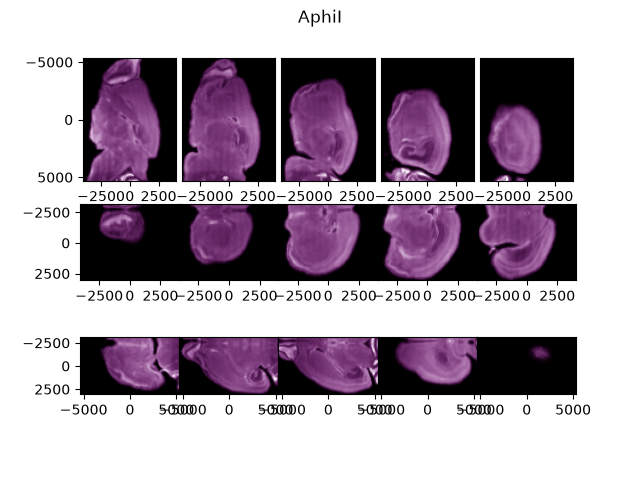

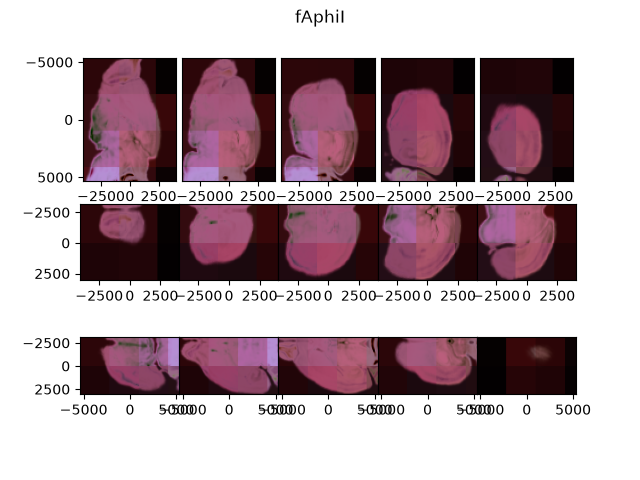

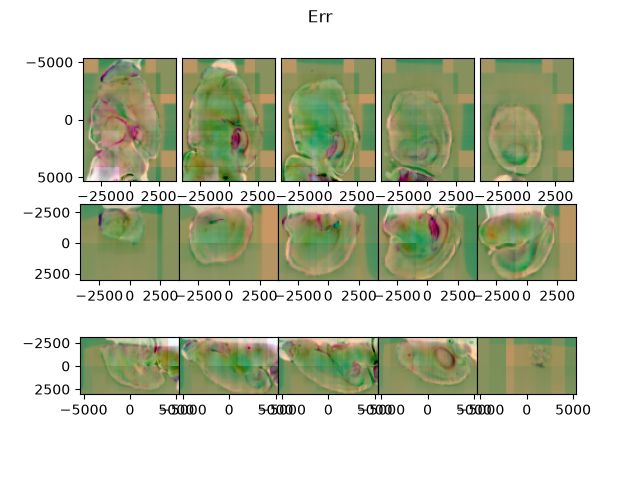

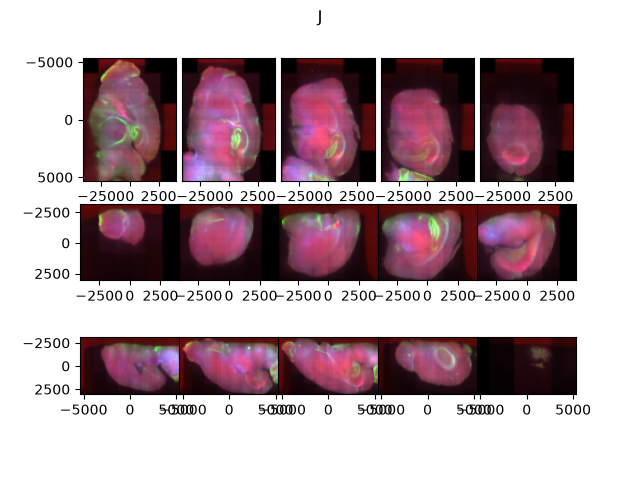

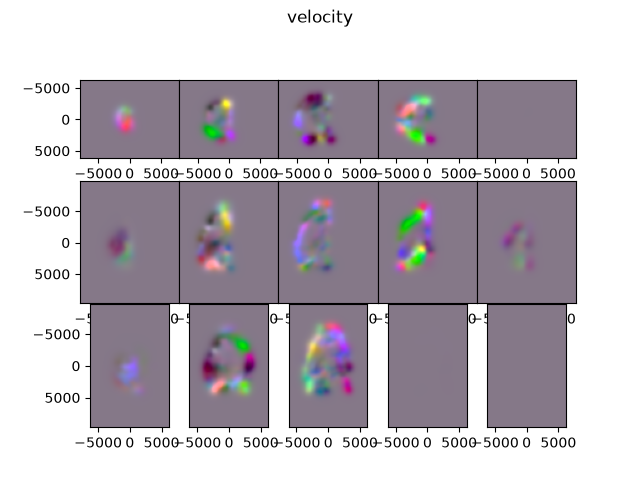

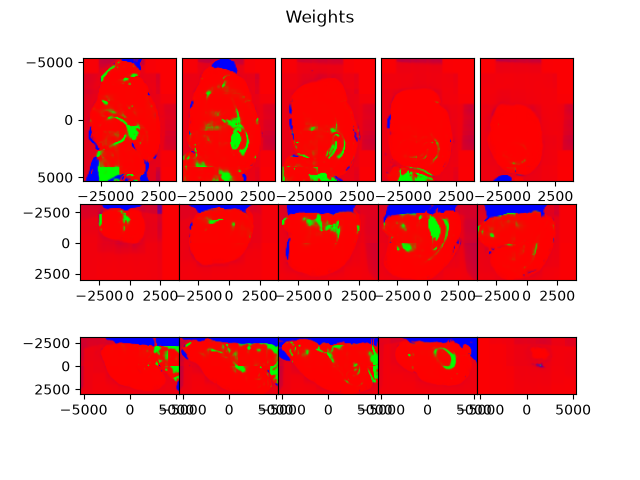

In [24]:
config['local_contrast'] = [32,32,32]
config['A'] = out['A']
config['v'] = out['v']
config['eA'] = config0['eA']/2
config['ev'] = config0['ev']/2
Istack = np.concatenate((Idb/np.max(Idb),(Idb/np.max(Idb))**2,))
#Istack = np.concatenate((Idb/np.max(Idb),(Idb/np.max(Idb))**2, (Idb/np.max(Idb))**3))
out1 = emlddmm.emlddmm(I=Istack,xI=xIdd,J=Jdb,xJ=xJd,**config)


In [25]:
down = 2
xIdd,Idd = emlddmm.downsample_image_domain(xId,Id,[down]*3)
xJd,Jd = emlddmm.downsample_image_domain(xJ,J,[down]*3)
Idb = gaussian_filter(Idd,(0,0.5,0.5,0.5))
Jdb = gaussian_filter(Jd,(0,0.5,0.5,0.5))

/home/dtward/data/csh_data/emlddmm/emlddmm.py:1445: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  v = torch.tensor(v.detach().clone(),device=device,dtype=dtype)


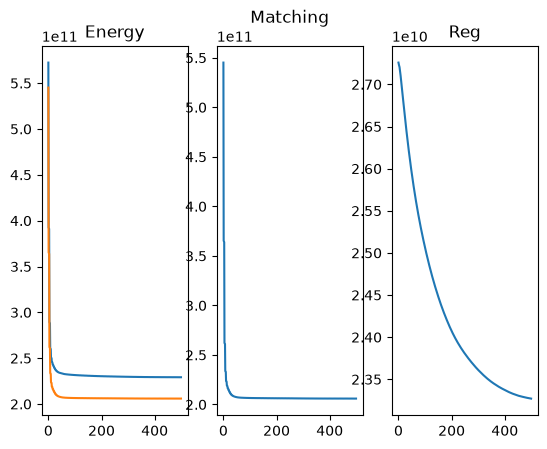

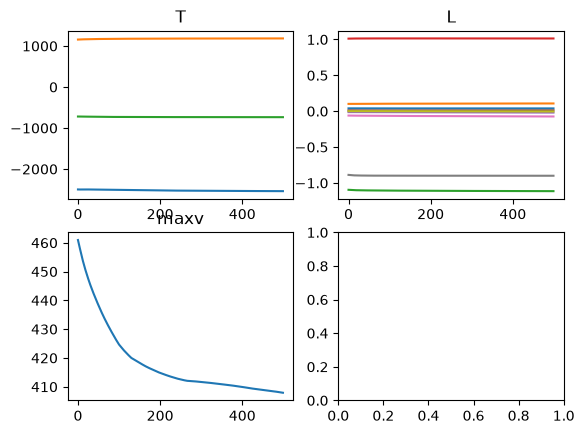

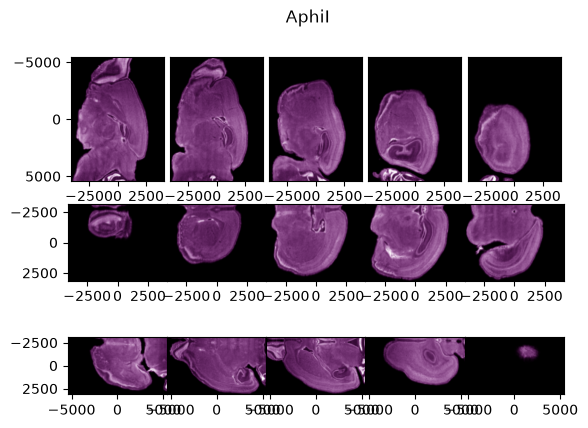

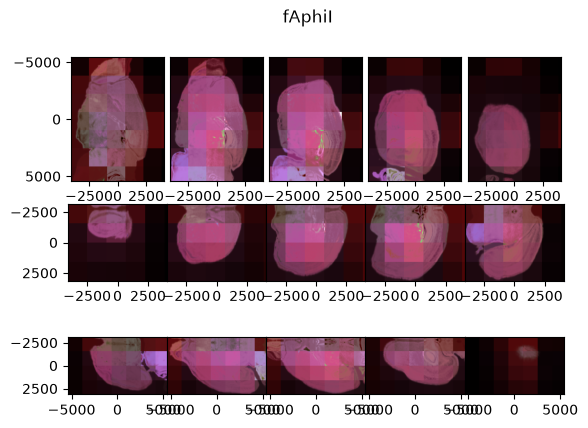

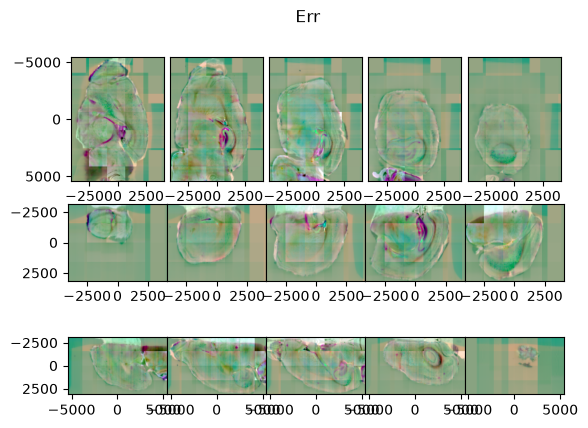

...

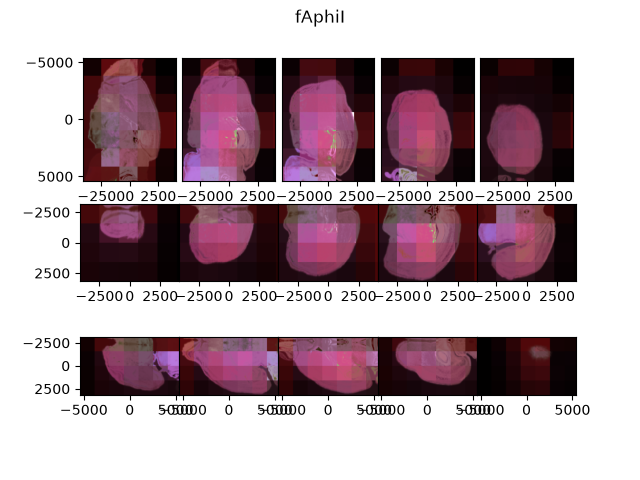

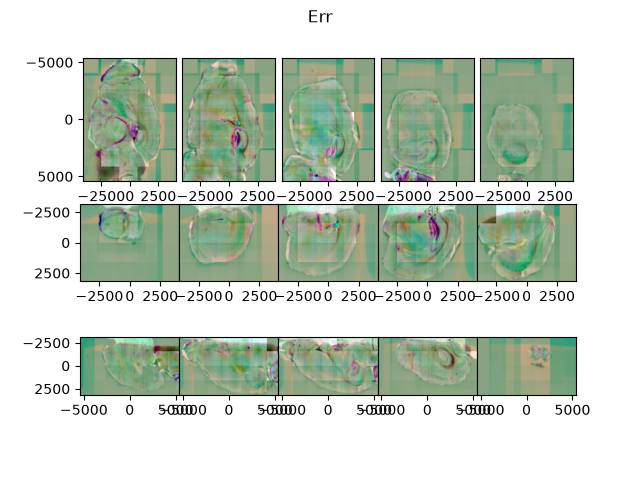

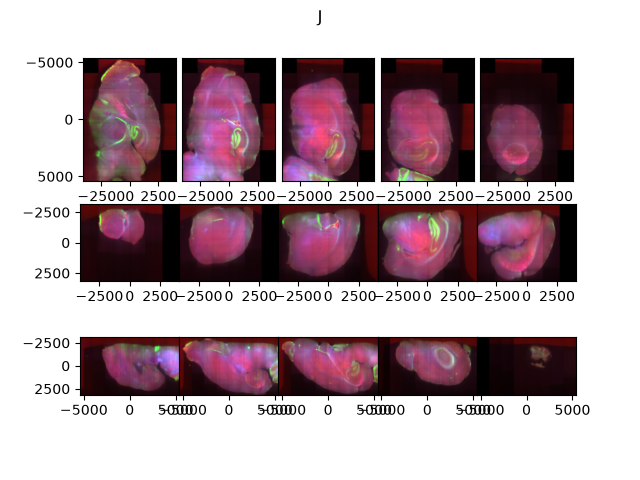

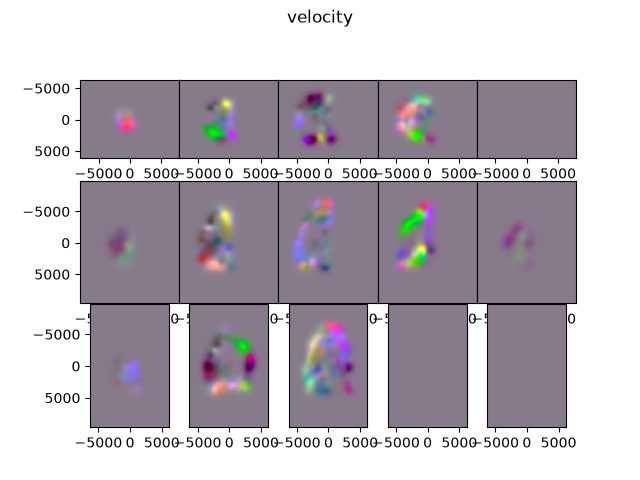

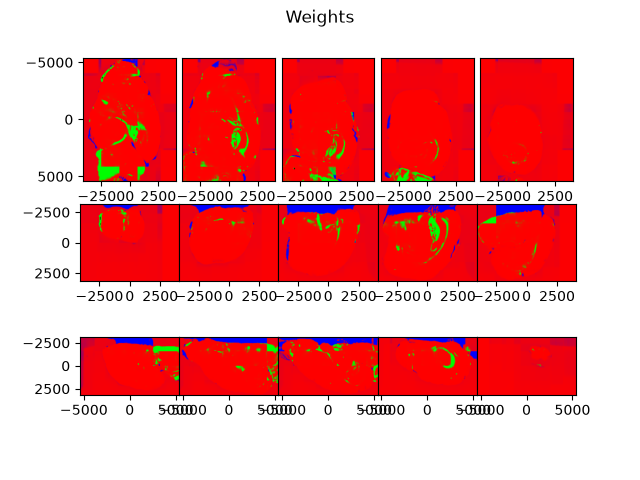

In [26]:
config['A'] = out1['A']
config['v'] = out1['v']
config['eA'] = config0['eA']/4
config['ev'] = config0['ev']/4
Istack = np.concatenate((Idb/np.max(Idb),(Idb/np.max(Idb))**2))
#Istack = np.concatenate((Idb/np.max(Idb),(Idb/np.max(Idb))**2, (Idb/np.max(Idb))**3))
out2 = emlddmm.emlddmm(I=Istack,xI=xIdd,J=Jdb,xJ=xJd,**config)


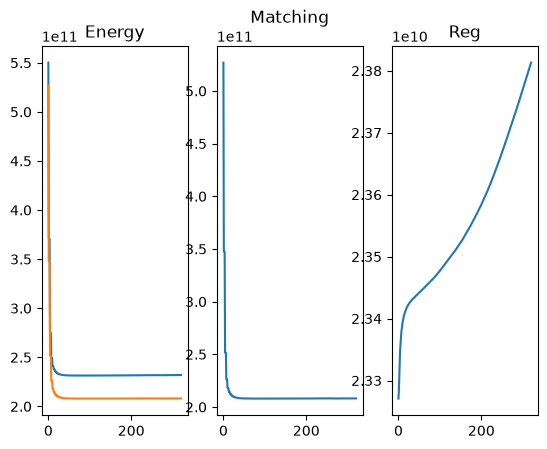

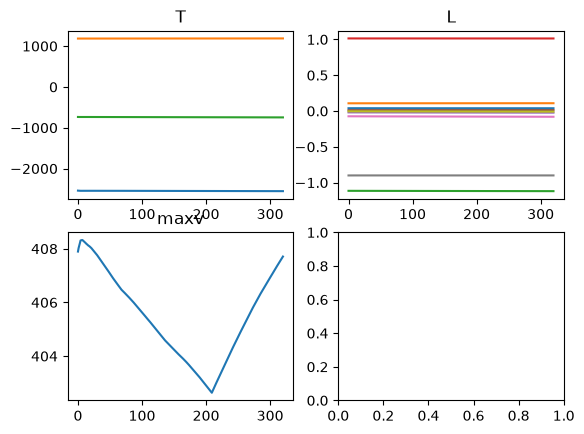

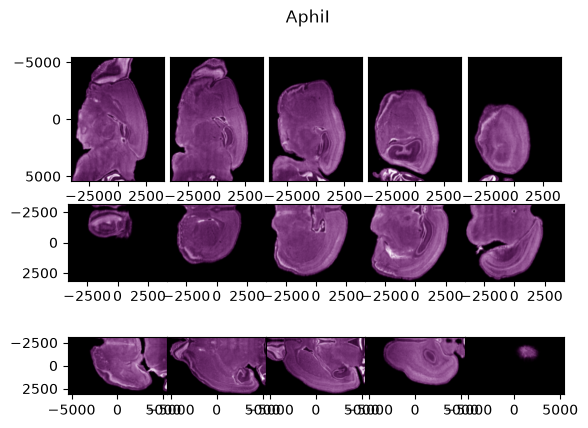

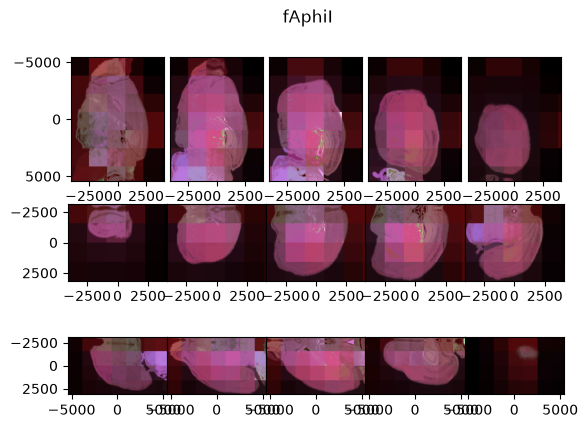

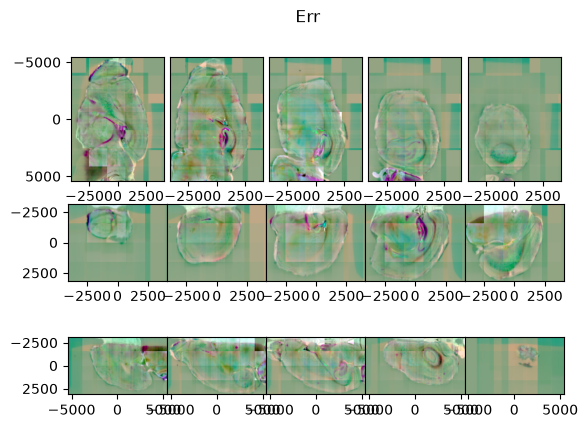

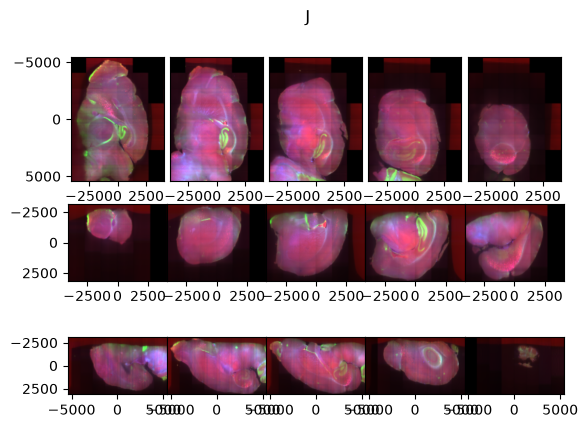

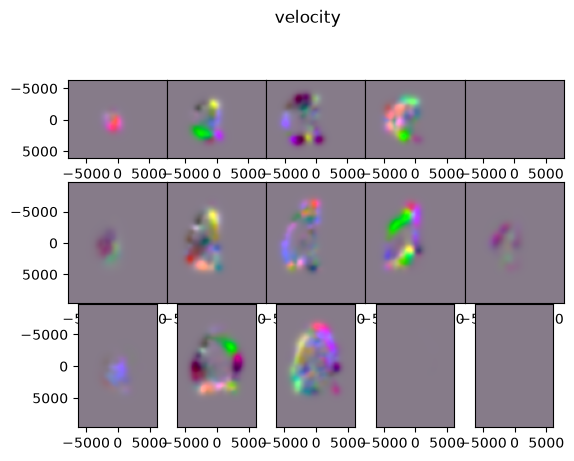

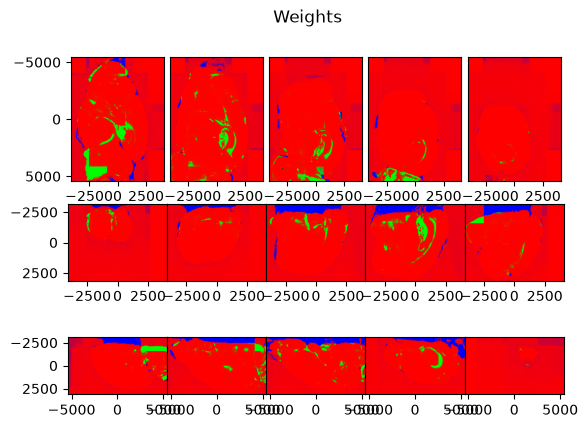

In [ ]:
# do a lot more iterations
config['A'] = out2['A']
config['v'] = out2['v']
config['eA'] = config0['eA']/4
config['ev'] = config0['ev']/4
config['n_iter'] = config0['n_iter'] * 4
Istack = np.concatenate((Idb/np.max(Idb),(Idb/np.max(Idb))**2))
#Istack = np.concatenate((Idb/np.max(Idb),(Idb/np.max(Idb))**2, (Idb/np.max(Idb))**3))
out2_ = emlddmm.emlddmm(I=Istack,xI=xIdd,J=Jdb,xJ=xJd,**config)


In [ ]:
# make a checkerboard
tform = emlddmm.compose_sequence([ emlddmm.Transform(out2['v'],'f',domain=out2['xv']),emlddmm.Transform(out2['A'],'f') ] , xId)


In [ ]:
phiiAiJ = emlddmm.apply_transform_float(xJ,J,tform,padding_mode='zeros')
phiiAiW = emlddmm.apply_transform_float(xJ,J,tform,padding_mode='zeros')

In [ ]:
emlddmm.draw(phiiAiJ,xId)

In [ ]:
emlddmm.draw(Id,xId)

In [ ]:
Id.shape

In [ ]:
W = phiiAiJ != 0
alpha = 0.5
phiiAiJshow = (phiiAiJ/phiiAiJ.amax(dim=(-3,-2,-1),keepdim=True)).numpy()
phiiAiJshow -= 0.05
phiiAiJshow /= phiiAiJshow.max()
phiiAiJshow = phiiAiJshow.clip(min=0)
phiiAiJshow **= 0.5
Ishow = (Id/Id.max())*(1-W.numpy()*alpha)*0.2 + phiiAiJshow*(W.numpy()*alpha)

In [ ]:
emlddmm.draw(Ishow,xId)

In [ ]:
emlddmm.draw(phiiAiJshow,vmin=0,vmax=1)

In [ ]:
# save it
np.savez(outputname,out2)


In [37]:
1

1